In [13]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/meat-freshness-image-dataset/Meat Freshness.v1-new-dataset.multiclass/README.dataset.txt
/kaggle/input/meat-freshness-image-dataset/Meat Freshness.v1-new-dataset.multiclass/valid/FRESH-174-_JPG.rf.7a6b44877bd3c287f8eff0b39cbaa482.jpg
/kaggle/input/meat-freshness-image-dataset/Meat Freshness.v1-new-dataset.multiclass/valid/HALF-FRESH-251-_JPG.rf.07bcc17218f507b4a6728c001b84183b.jpg
/kaggle/input/meat-freshness-image-dataset/Meat Freshness.v1-new-dataset.multiclass/valid/HALF-FRESH-762-_JPG.rf.9d6f149d5327c8979a61c40869438e53.jpg
/kaggle/input/meat-freshness-image-dataset/Meat Freshness.v1-new-dataset.multiclass/valid/HALF-FRESH-701-_JPG.rf.fc03be9671b1dd3a566babcc14dfec3c.jpg
/kaggle/input/meat-freshness-image-dataset/Meat Freshness.v1-new-dataset.multiclass/valid/SPOILED-1038-_JPG.rf.e87df85da49da49b9264c4b71bd5ae04.jpg
/kaggle/input/meat-freshness-image-dataset/Meat Freshness.v1-new-dataset.multiclass/valid/FRESH-810-_JPG.rf.c0bcd1ada2c41fda9a74f1c51f0ae7da.jpg
/kaggle/i

In [14]:
!nvidia-smi

Tue Sep 16 12:49:39 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   57C    P8             12W /   70W |       3MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [15]:
import os
HOME = os.getcwd
print(HOME)

<built-in function getcwd>


In [16]:
!pip install ultralytics

In [17]:
import ultralytics
from ultralytics import YOLO
ultralytics.checks()

from IPython import display
from IPython.display import display, Image
#display.clear_output()

Ultralytics 8.3.200 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6411.5/8062.4 GB disk)


In [18]:
model = YOLO(f'{HOME}/yolov8n.pt')

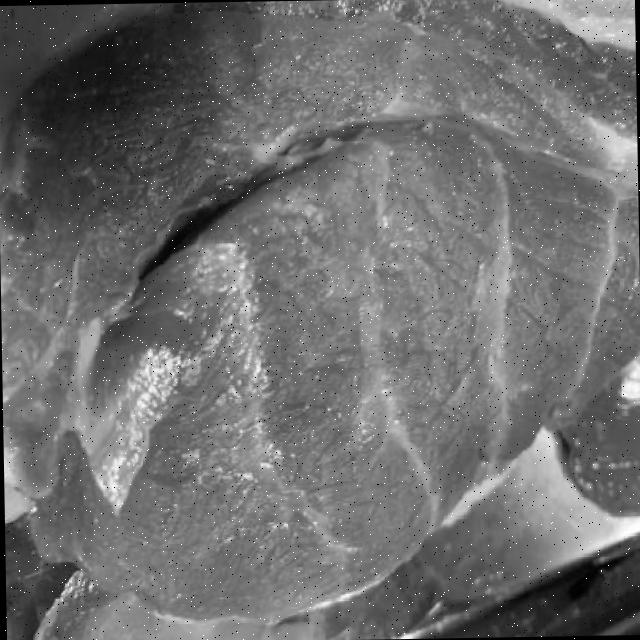

In [19]:
Image(filename=f'/kaggle/input/meatfreshnesskaggle2266-augmented/train/images/FRESH-1-_JPG.rf.30947a43a4c785b343f85acd9e2a40f9.jpg', 
      width=500)

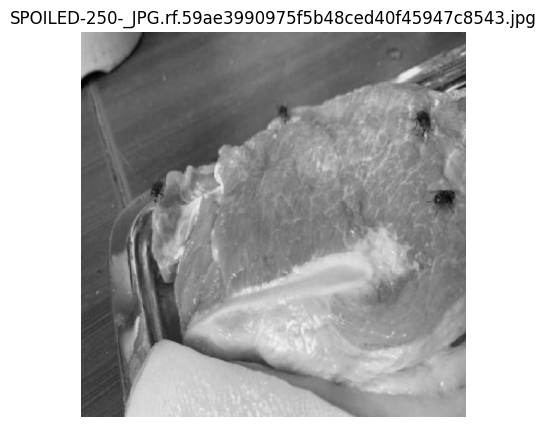

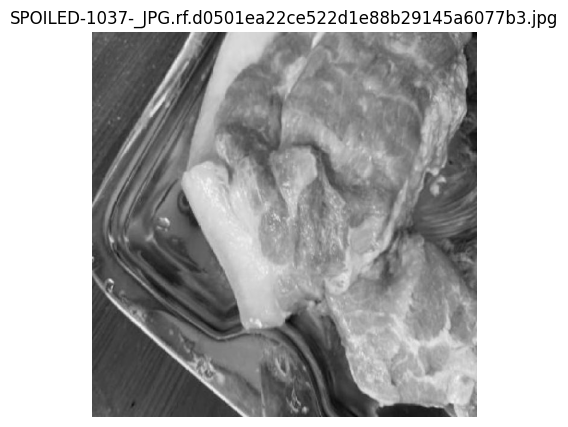

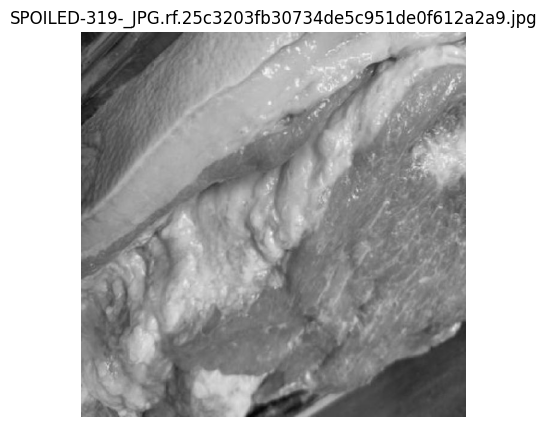

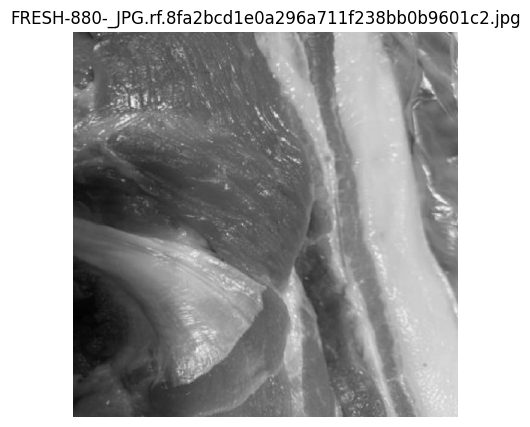

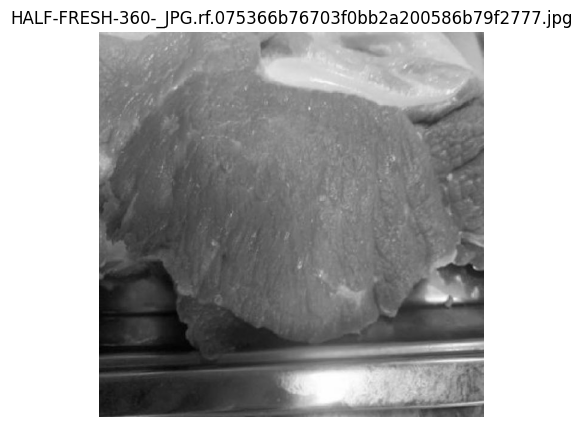

In [20]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img_paths = glob.glob('/kaggle/input/meatfreshnesskaggle2266-augmented/valid/images/*.jpg')[:5]

for img_path in img_paths:
    img = mpimg.imread(img_path)
    plt.figure(figsize=(5, 5))
    plt.axis('off')
    plt.title(img_path.split('/')[-1])
    plt.imshow(img)
    plt.show

In [21]:
!yolo detect train data='/kaggle/input/meatfreshnesskaggle2266-augmented/data.yaml' model=yolov8s.pt epochs=200 imgsz=640 patience=10

Ultralytics 8.3.200 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/meatfreshnesskaggle2266-augmented/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=200, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, persp

In [23]:
!mkdir -p /kaggle/working/MRTD_meatFreshness
!cp /kaggle/working/runs/detect/train2/weights/best.pt /kaggle/working//MRTD_meatFreshness/MRTD_meatFreshness.pt

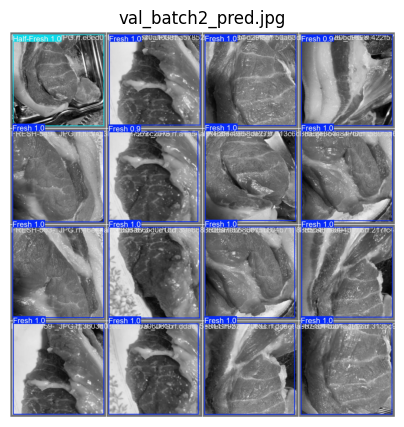

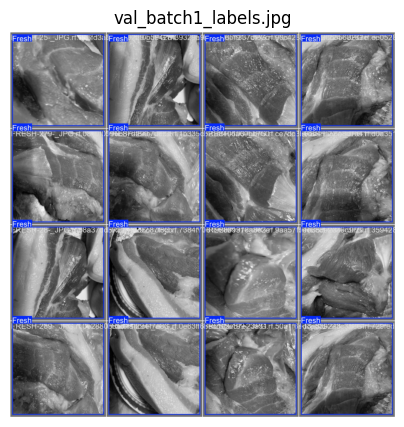

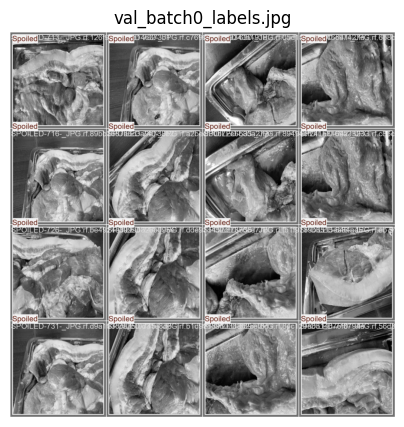

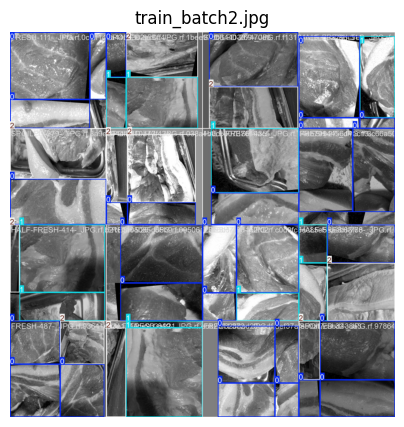

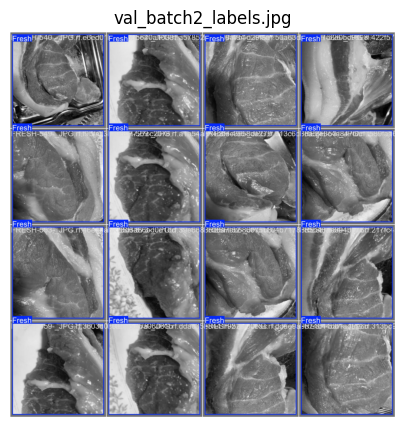

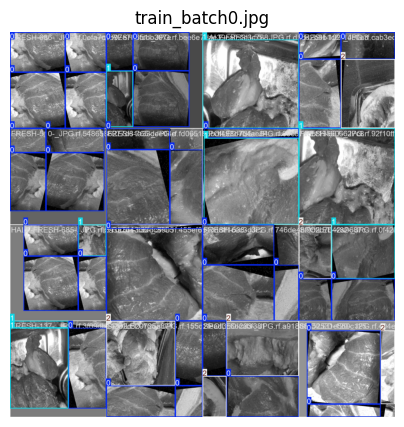

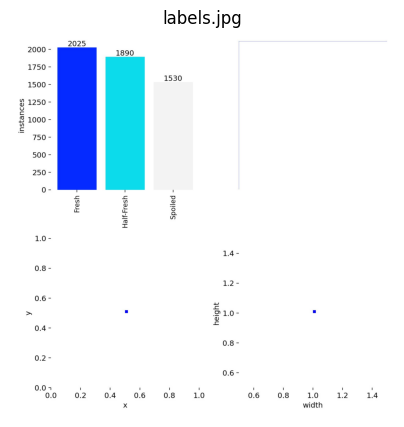

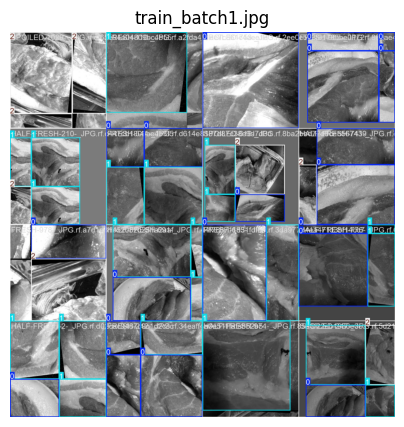

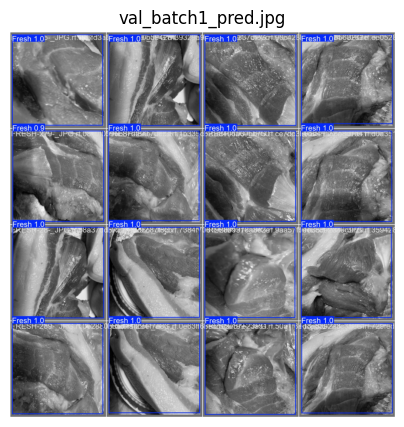

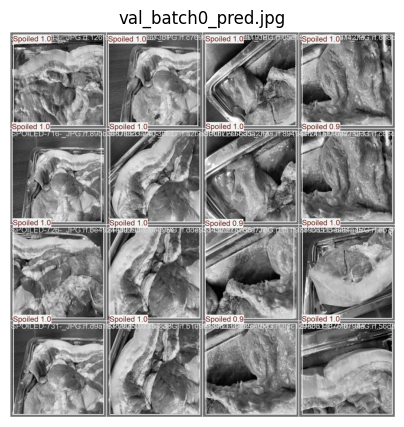

In [24]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img_paths = glob.glob('/kaggle/working/runs/detect/train2/*.jpg')[:10]

for img_path in img_paths:
    img = mpimg.imread(img_path)
    plt.figure(figsize=(5, 5))
    plt.axis('off')
    plt.title(img_path.split('/')[-1])
    plt.imshow(img)
    plt.show

/kaggle/working/runs/detect/train2/confusion_matrix_normalized.png


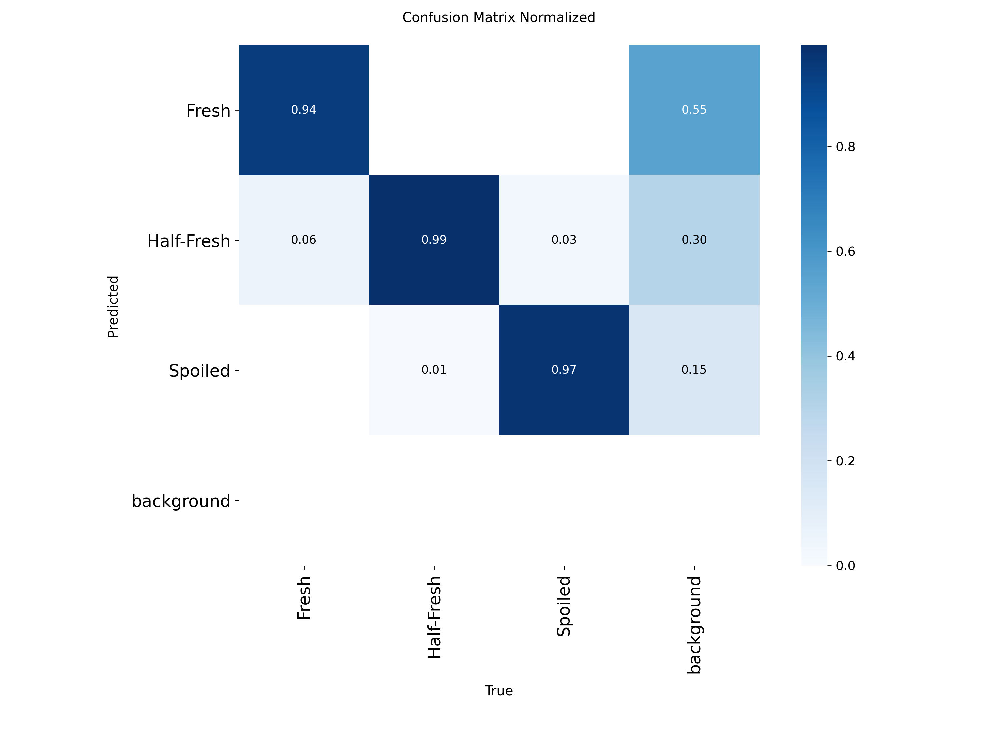

/kaggle/working/runs/detect/train2/results.png


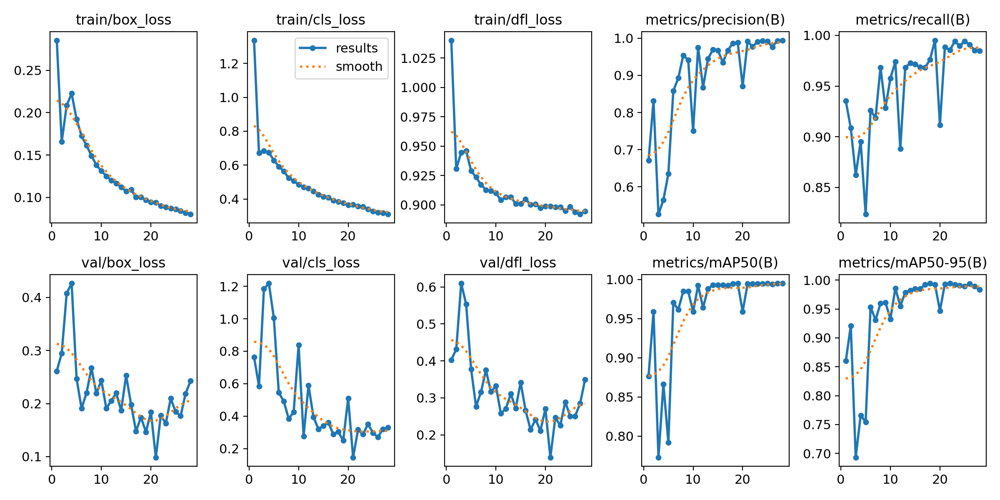

/kaggle/working/runs/detect/train2/BoxP_curve.png


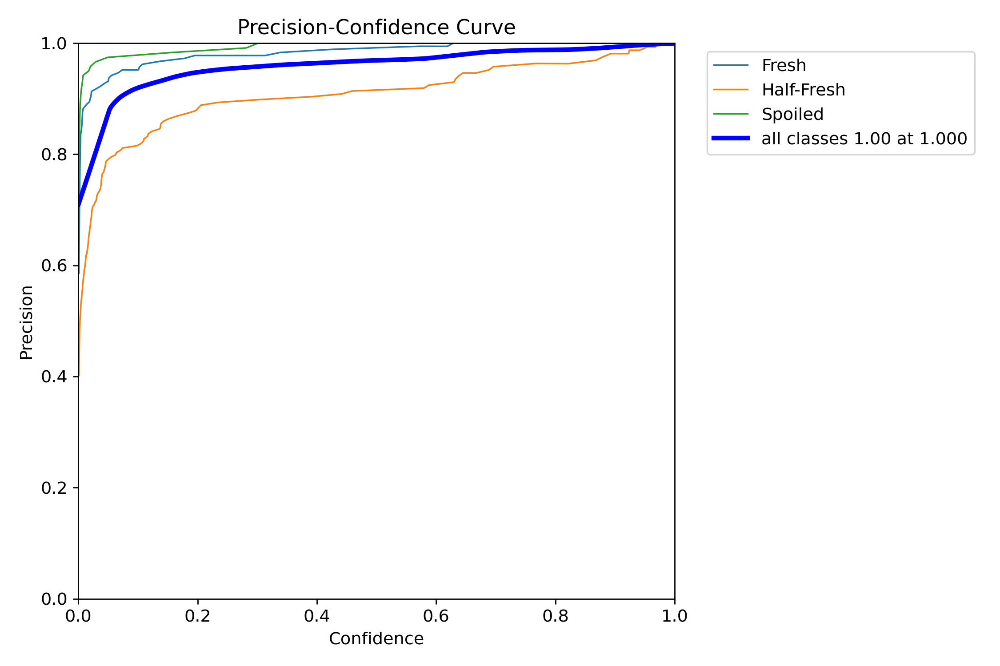

/kaggle/working/runs/detect/train2/BoxPR_curve.png


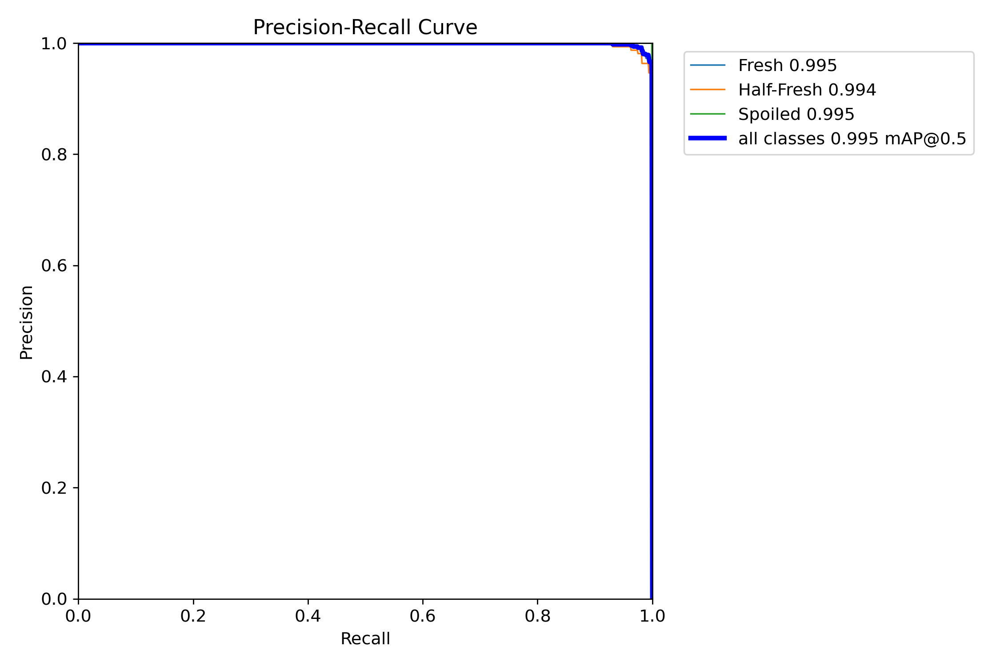

/kaggle/working/runs/detect/train2/confusion_matrix.png


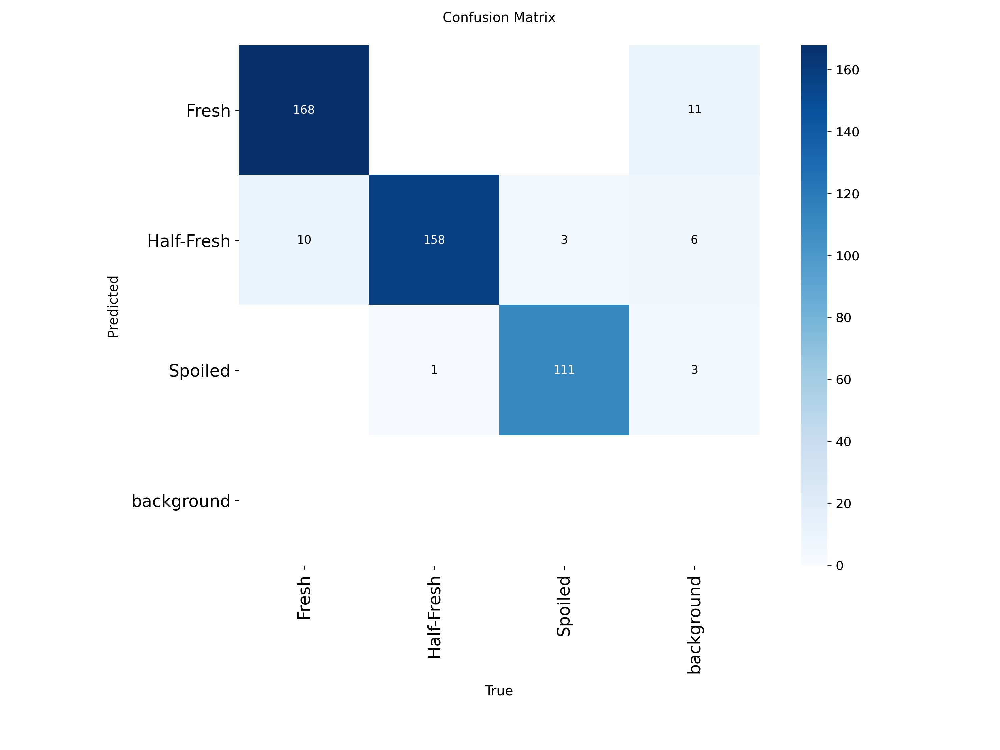

/kaggle/working/runs/detect/train2/BoxF1_curve.png


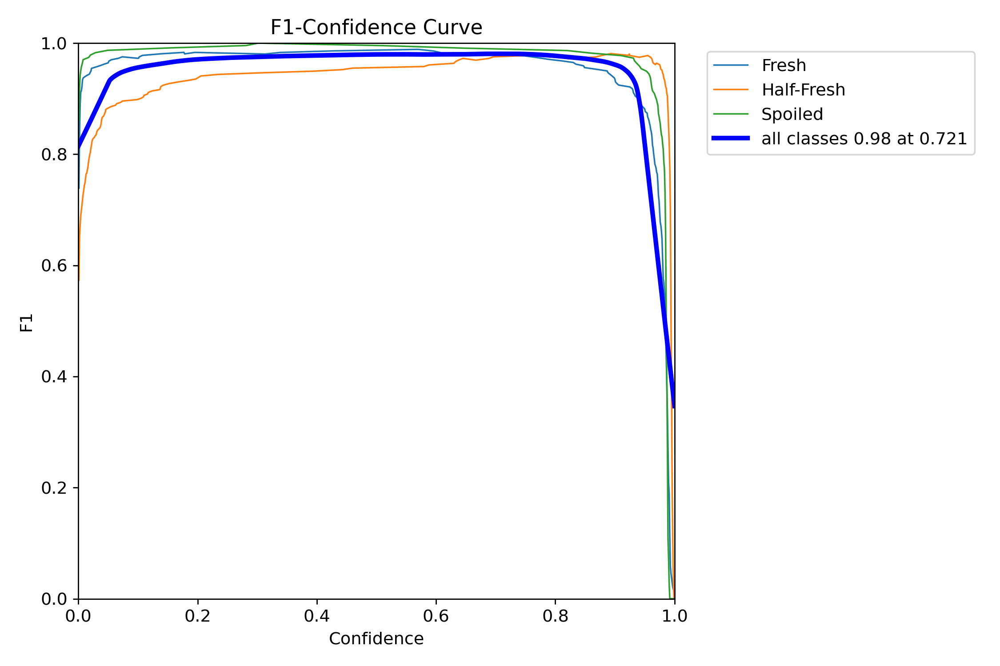

/kaggle/working/runs/detect/train2/BoxR_curve.png


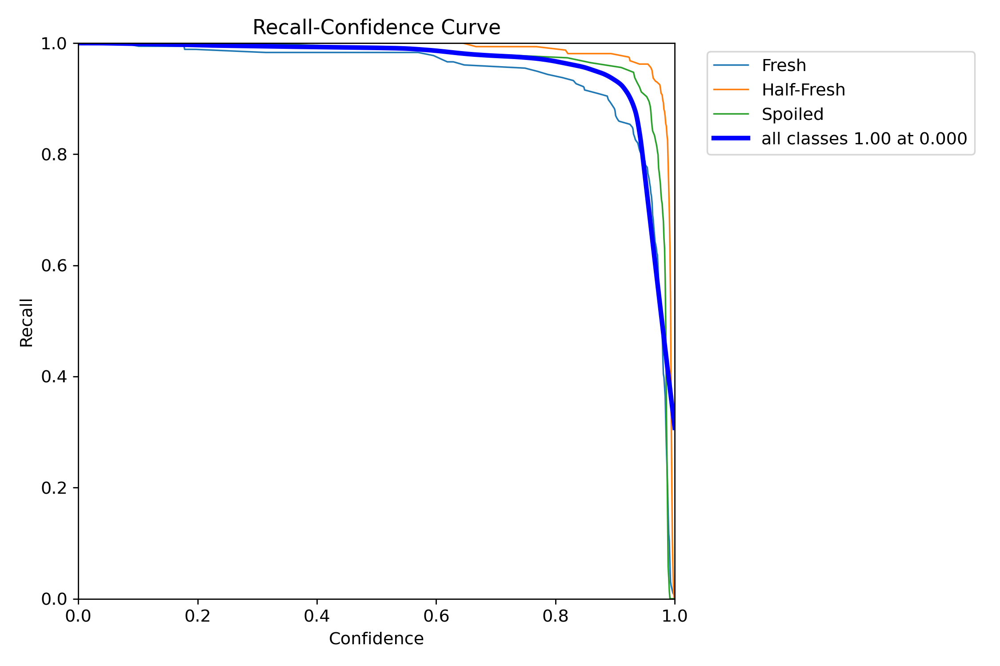

In [25]:
y_model = '/kaggle/working/runs/detect/train2'
resplts = [f for f in os.listdir(y_model) if f.endswith(('.png'))]

for res in resplts:
    print(os.path.join(y_model, res))
    display(Image(filename=os.path.join(y_model, res)))

/kaggle/working/runs/detect/train2/val_batch2_pred.jpg


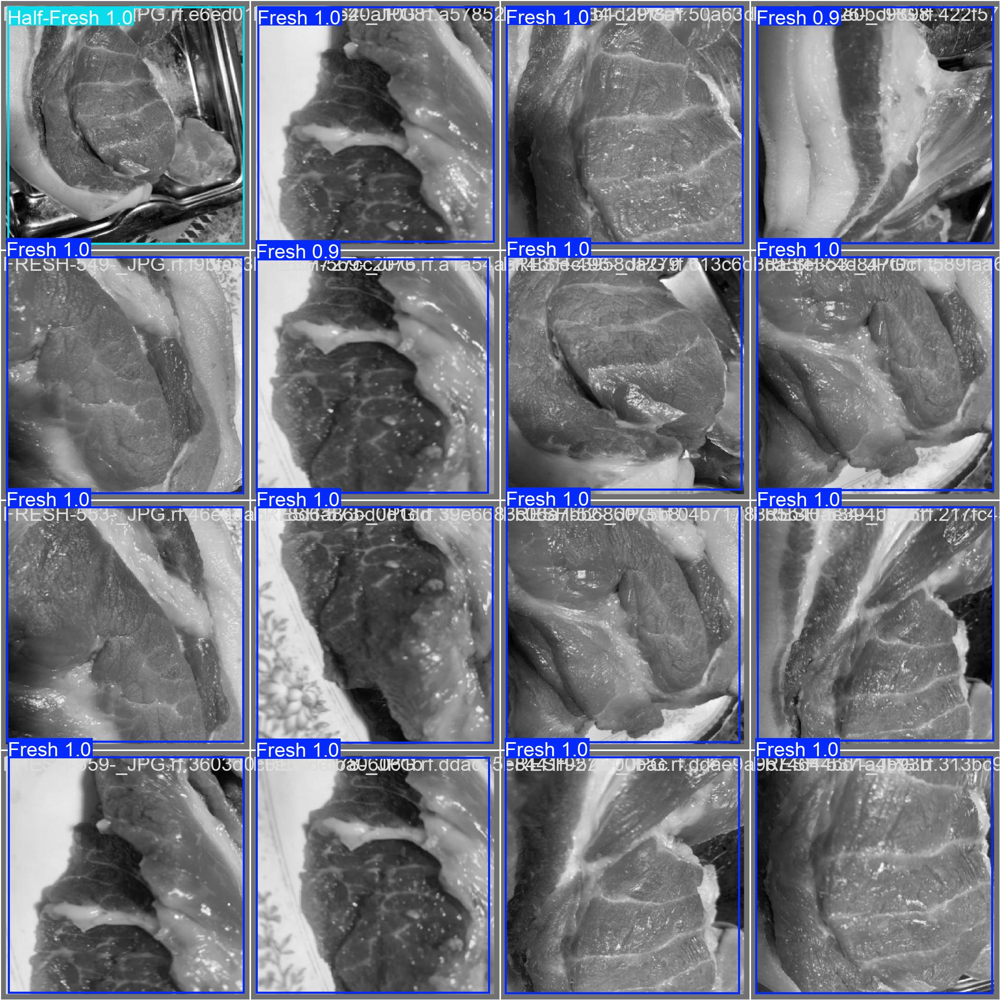

/kaggle/working/runs/detect/train2/val_batch1_labels.jpg


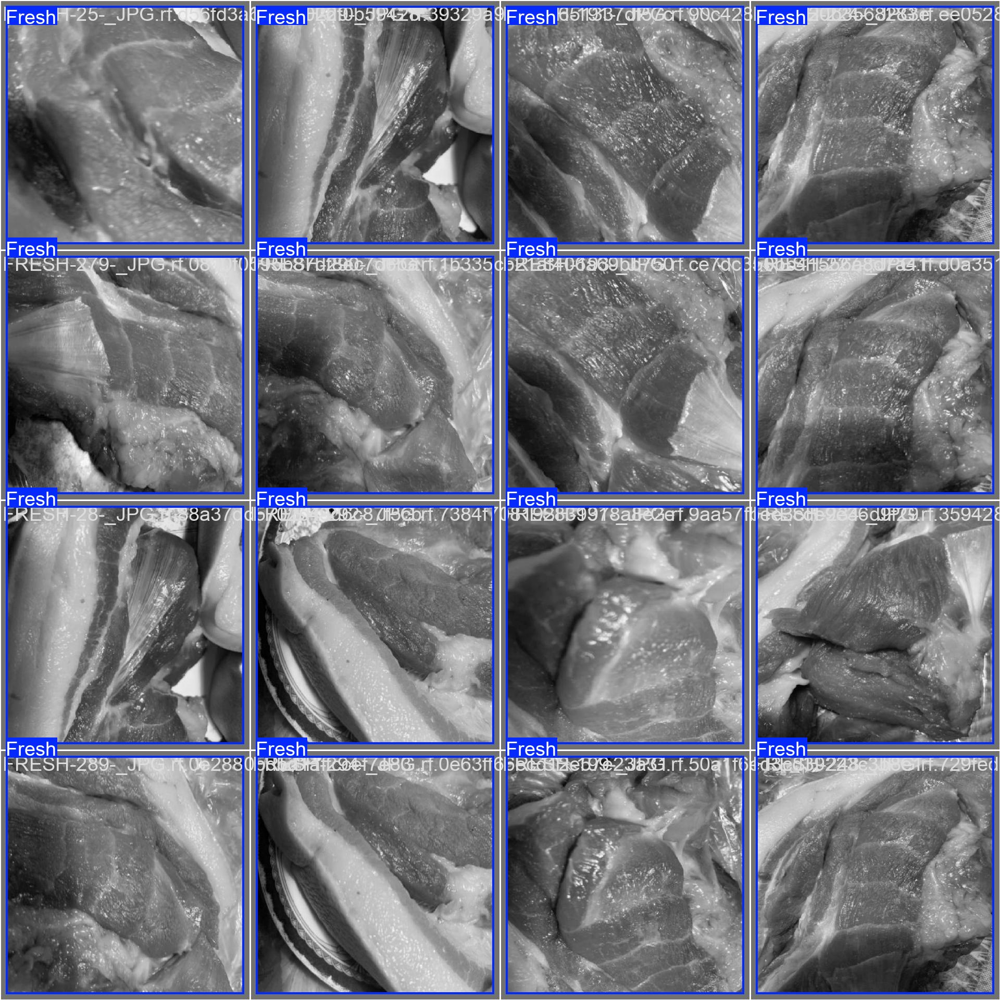

/kaggle/working/runs/detect/train2/val_batch0_labels.jpg


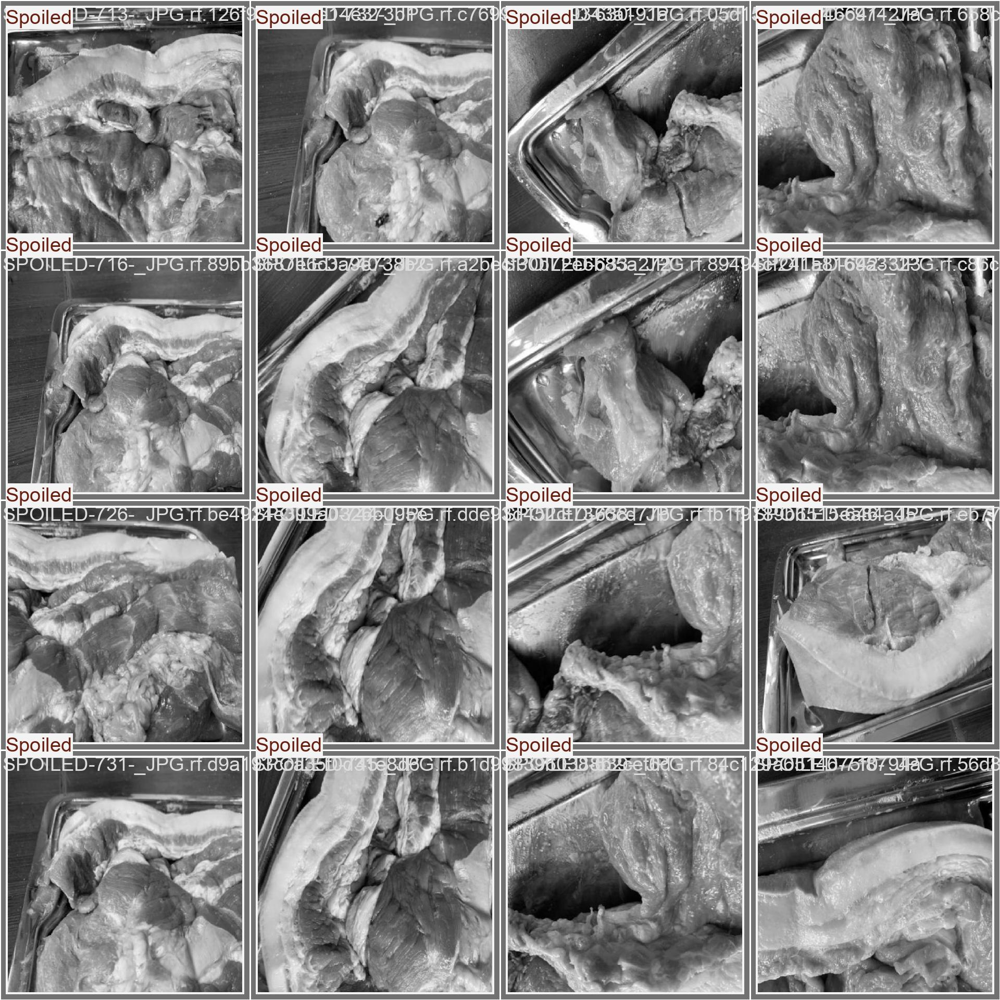

/kaggle/working/runs/detect/train2/train_batch2.jpg


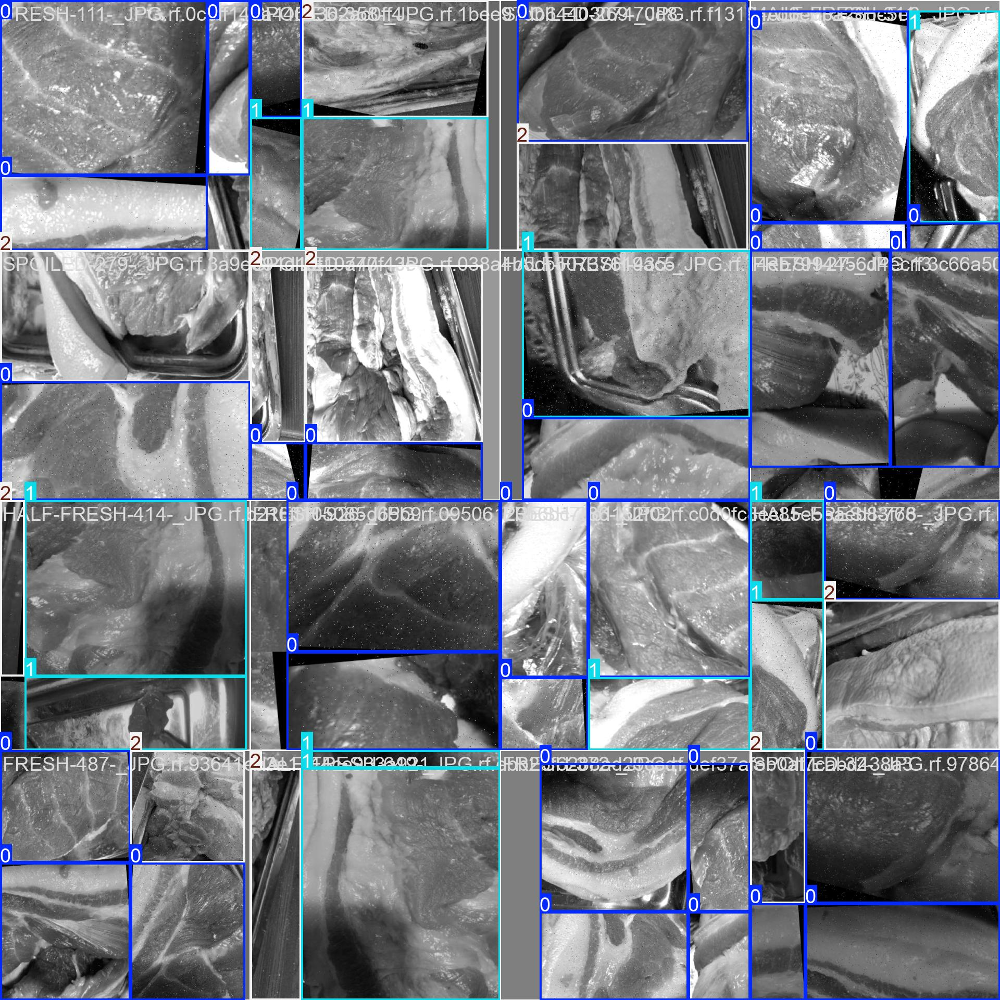

/kaggle/working/runs/detect/train2/val_batch2_labels.jpg


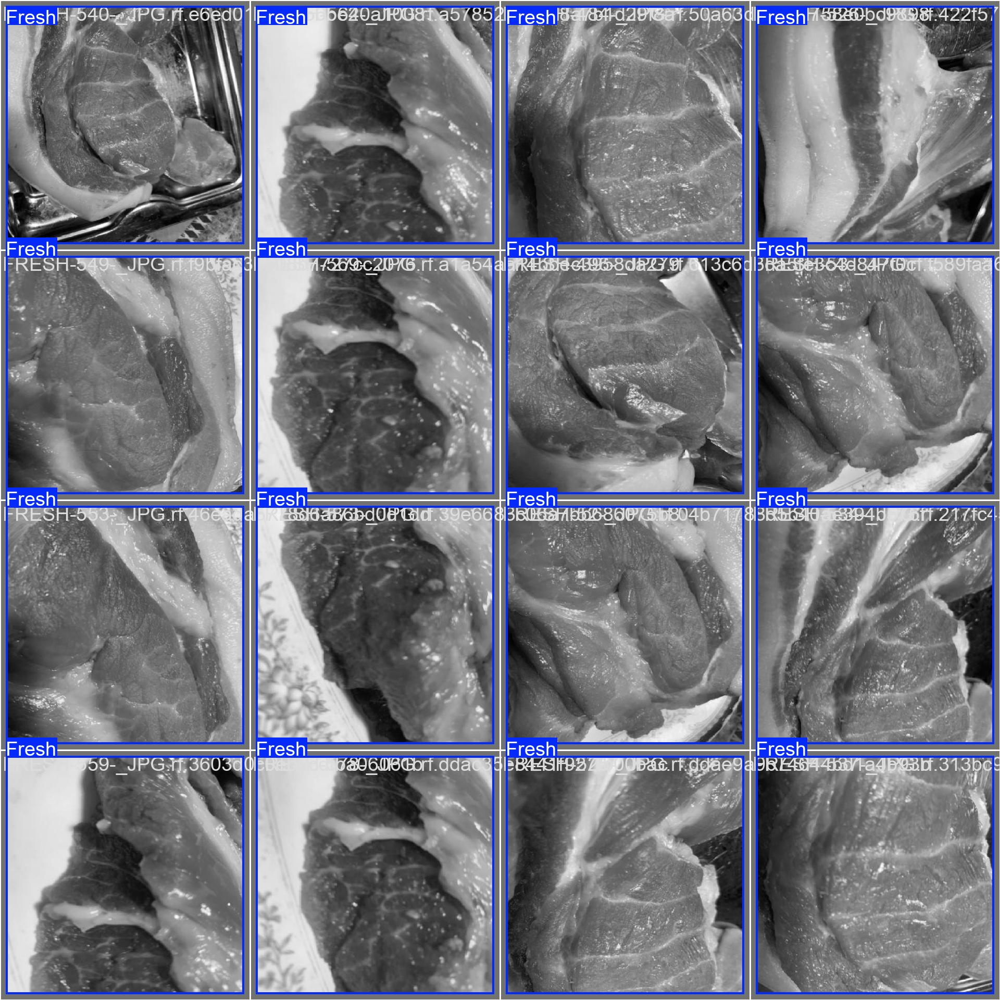

/kaggle/working/runs/detect/train2/train_batch0.jpg


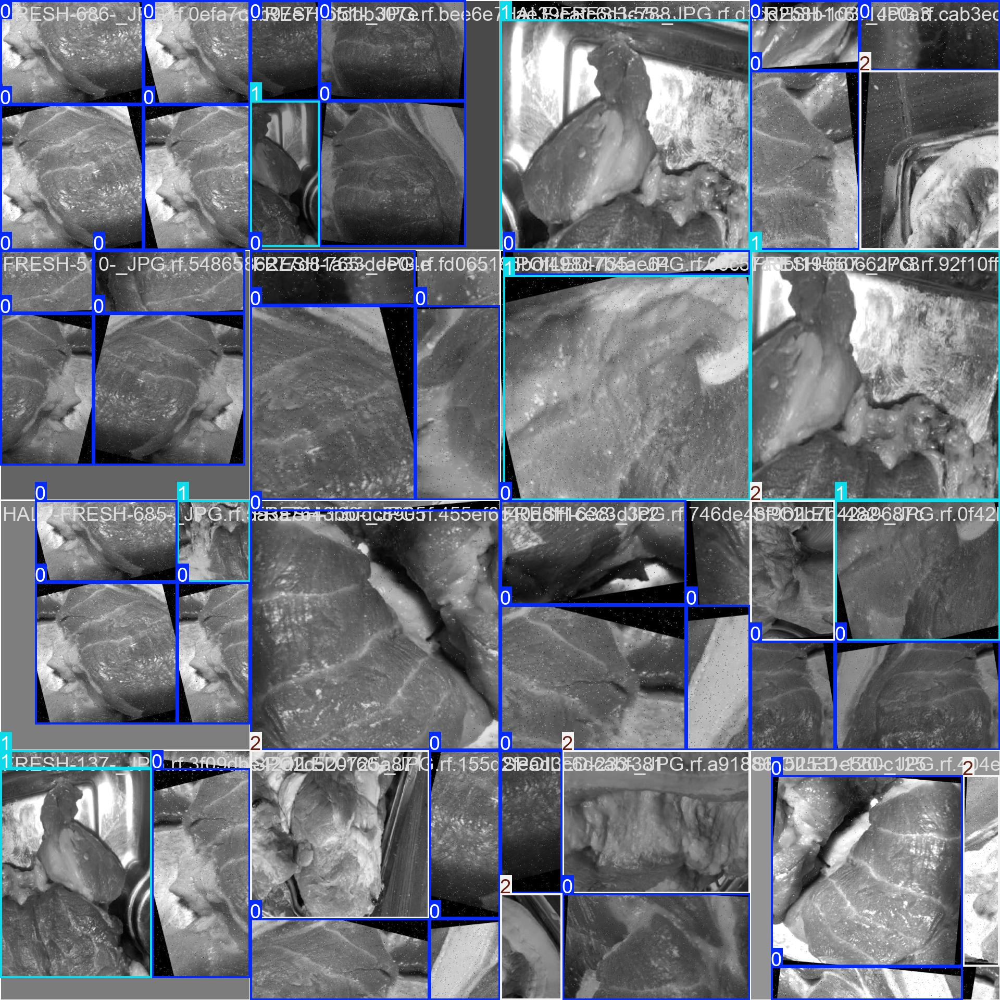

/kaggle/working/runs/detect/train2/labels.jpg


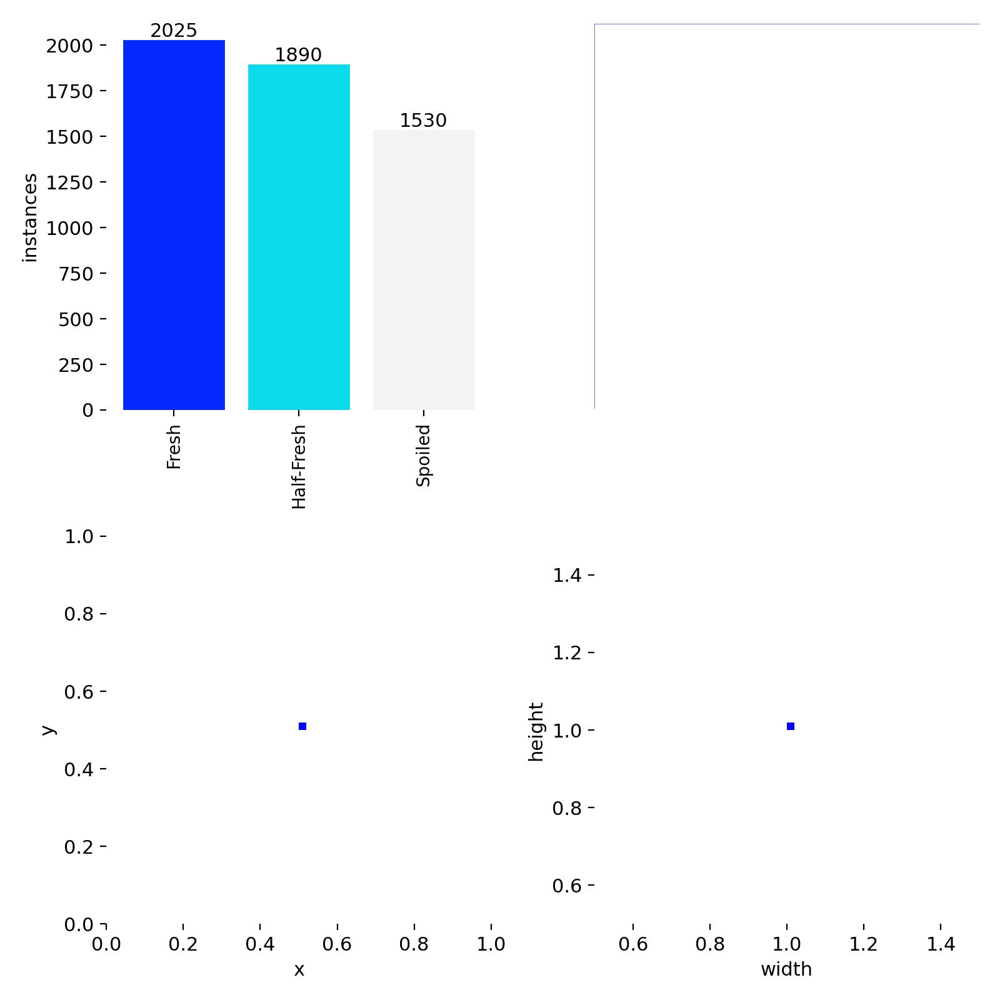

/kaggle/working/runs/detect/train2/train_batch1.jpg


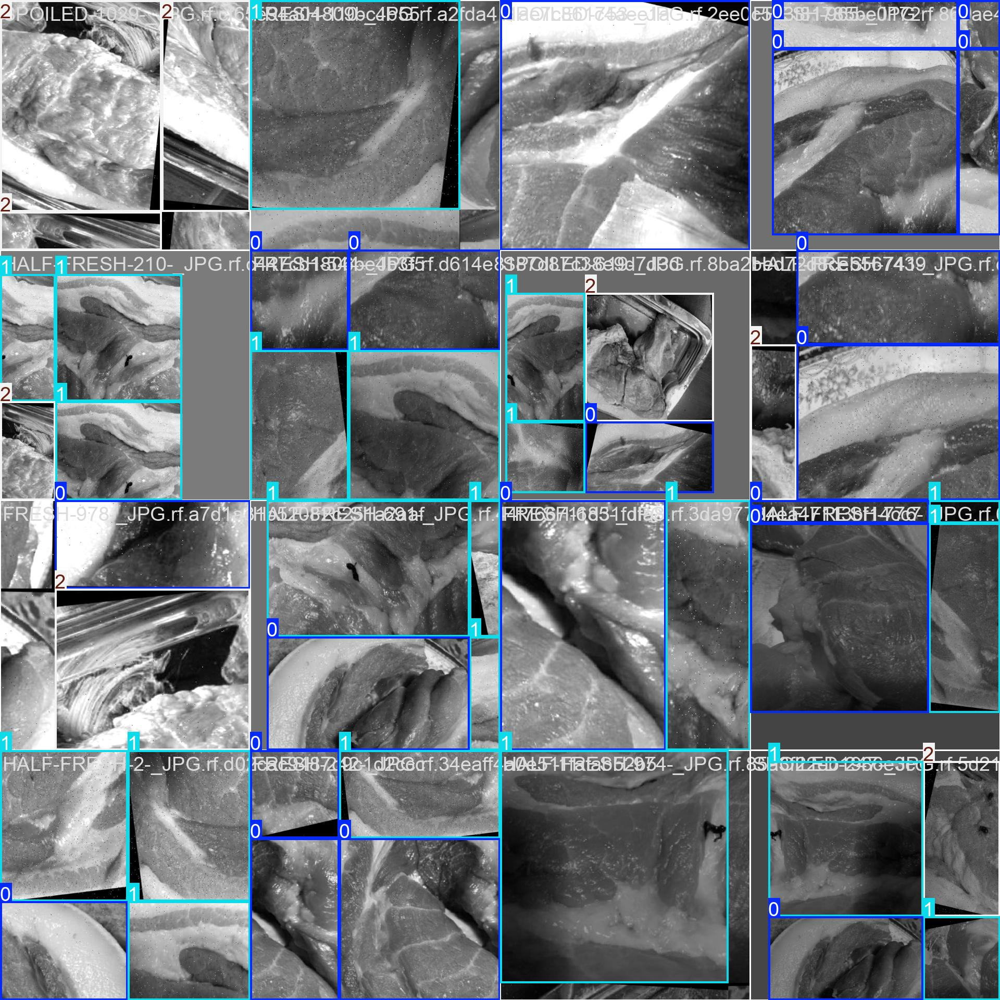

/kaggle/working/runs/detect/train2/val_batch1_pred.jpg


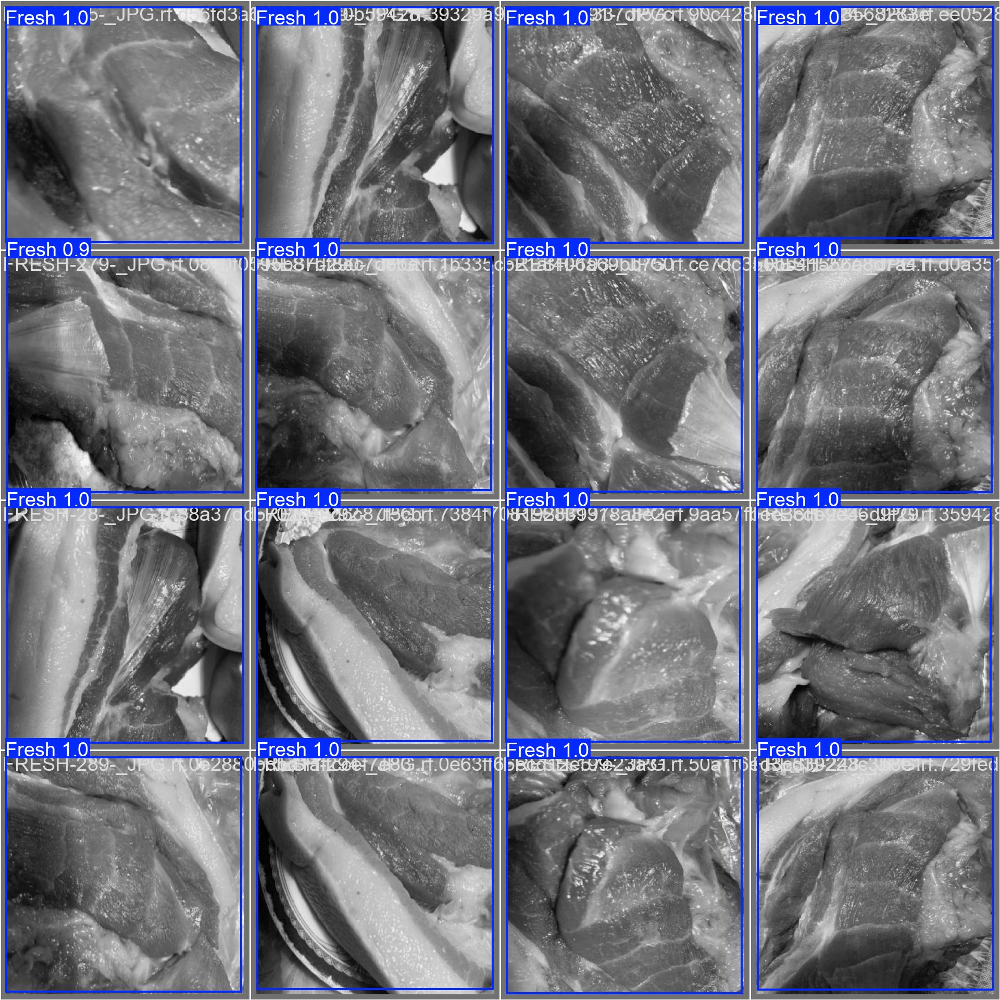

/kaggle/working/runs/detect/train2/val_batch0_pred.jpg


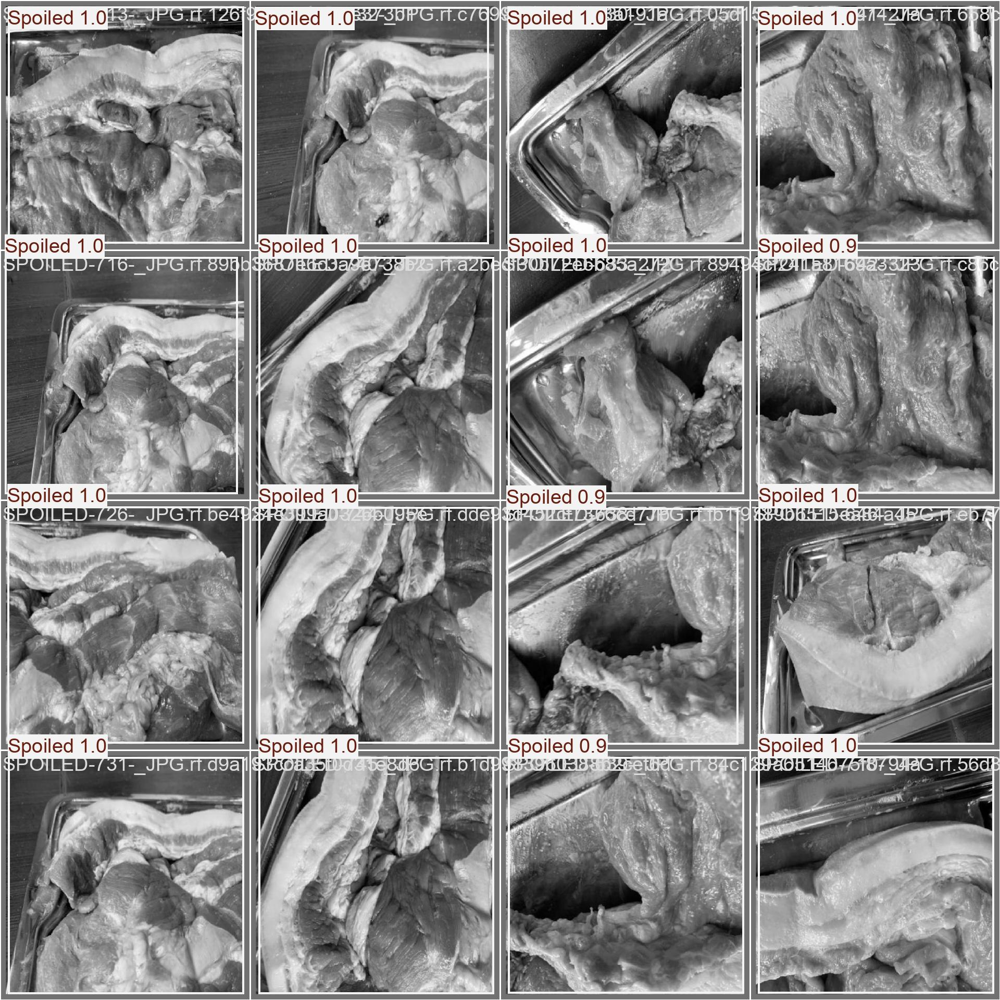

In [27]:
valBatch = [f for f in os.listdir(y_model) if f.endswith(('.jpg'))]

for val in valBatch:
    print(os.path.join(y_model, val))
    display(Image(filename=os.path.join(y_model, val)))

In [30]:
# model = YOLO('/kaggle/working/runs/detect/train2/weights/best.pt')

model = YOLO('/kaggle/input/mrtd_meatfreshness_aug1/keras/default/1/MRTD_meatFreshness_aug1.pt')

In [31]:
from ultralytics import YOLO
import gradio as gr
from PIL import Image

model = YOLO('/kaggle/working/runs/detect/train2/weights/best.pt')

def predict(img):
    results = model(img)
    annotated_img = results[0].plot()  
    return Image.fromarray(annotated_img)

demo = gr.Interface(
    fn=predict,
    inputs=gr.Image(type="filepath", label="Upload an Image"),
    outputs=gr.Image(type="pil", label="Prediction"),
    title="YOLO Object Detection",
    description="Upload a photo and get YOLO predictions."
)

demo.launch(share=True)


* Running on local URL:  http://127.0.0.1:7861
* Running on public URL: https://c72e38c4e597a4bf76.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
